# Julia 4: Packages. Plots package
### Bernt Lie
#### University of South-Eastern Norway
#### May, 2021; minor update September 2023

## Learning goals
In this session, we will look at:
* basics of packages
* The `Plots` package, as well as basics of the `Images` package

## Packages
### Package manager
Julia comes with a "package manager" which helps installing packages from the `Git` system [a document/file version control system]. There are two ways to use the package manager:
* In a Package manager mode of REPL
* By importing the `Pkg` package, and using the package manager commands.

The default prompt in Julia's REPL is `julia>`. Type `]`, and you enter the package manager mode, with prompt `(@v1.9) pkg>`. There are various commands for adding package, removing packages, looking at the status, etc.

Alternatively, stay in the REPL (prompt: `julia>`), and import the package manager via command: `julia> using Pkg`. Next, install packages `Plots` and `LaTeXStrings` as follows:
```julia
julia> Pkg.add("Plots")
julia> Pkg.add("LaTeXStrings")
```
Alternatively, several packages can be added simultaneously via a vector of strings, e.g., `Pkg.add(["Plots", "LaTeXStrings"])`. To remove a packages, do, e.g., `Pkg.rm("Plots")`. To check the status of installed packages (version no., etc.), do `Pkg.st()`.

To batch-install a large number of packages, create an ASCII file named (e.g.) `Package_add.jl`, with content, e.g.:
```
using Pkg
Pkg.add("Plots")
Pkg.add("LaTeXStrings")
...
```
and execute the file in Julia by `julia> include("Package_add.jl")`. This is handy if you want to install the same packages on several computers: simply run the `include` statement on each computer. It is necessary to include the path of file `Package_add.jl` in the file name, unless you start Julia from the directory where the `Package_add.jl` file is located.

### Package structure

Modules and packages are normally stored using `Git`, and can be added using the Package manager. *Modules* and *packages* contain some header information, as well as constants, function names, types, etc. We will not go into much detail about modules and packages here. However, the following is important to know.

* In modules and packages, the developer may *choose* to *export* some functions, and to *not export* others. 

### Importing packages
We have already seen that we can import the package manager by command `julia> using Pkg`. In Julia, there are essentially two ways to import packages: via the `using` keyword, and via the `import` keyword. 

* The `using` keyword ensures that those functions that have been `export`:ed by the package designer, are available in the global name space. In other words: we can simply use the function name directly. On the other hand, the functions that have *not* been `export`:ed, are *not* in the global namespace, but instead are in the package namespace. In the Package manager `Pkg`, functions `add`, `rm`, `st`, etc. have *not* been `export`:ed, and are therefore in the *package namespace*. For functions (and constants) in the package namespace, we need to prepend the functions (and constants) by the packagename + ".", e.g., `Pkg.add`.

* The `import` keyword leaves all functions and constant in the package namespace, and if we choose to `import` a package, we need to prepend functions and constants with the package name + ".".

Because Julia uses multiple dispatch, and distinguishes between functions based on their argument types, strict handling of the namespace is less critical in Julia than in other languages such as Python or MATLAB.

However, it may make the code clearer/more pedagogical if we use the `import` function and explicitly uses the package name to specify which function we use.

Sometimes, we only want to import a subset of functions and constants from a package. This can be done by either:
```julia
using Pkg: add, rm
import Pkg: add, rm
```
where imported functions are listed after the colon `:`. Reducing the number of imported functions will reduce the memory usage of the code.

Since Julia v. 1.6, it has also been possible to give an *alias* to a package name. This is useful when package names are long/complex, or to make the usage clearer. Using an alias only makes sense with the `import` keyword. Examples:
```julia
import Plots as plt
```

## Plotting
### General
Julia has many plotting packages, with different features. The `Plots.jl` package is probably the one that is most used, and is the one discussed here. Other packages support some interactivity in plotting. A relatively new and very powerful package is `Makie`, which is written in Julia from the outset of. At the start, `Makie` essentially contained plotting primitives, and was not that easy to use. Work is underway to define commands that will make `Makie` simpler to use. Most likely, `Makie` will become some sort of standard for `Julia` in the future, as there is work underway to support `Makie` in the scientific computing packages of Julia.

### On Plots
Package `Plots` is really a "meta language" for expressing plots; `Plots` was initiated by Tom Breloff, but the maintenance has been taken over by others. When doing actual plots, `Plots` commands are converted to suit some chosen *backend*  package which does the actualy plotting. Examples of back-end packages are `PyPlot` (from the Python world), `GR` (default back-end), `UnicodePlots` (primitive plots in REPL), `PGFPlotsX` ($\LaTeX$ based), `Plotly` (some interactivity), and others. Because not all back-ends have the same possibilities, not every back-end supports all possibilities in `Plots`. `GR` produces crisp plots, is the default back-end, and is cathing up with `PyPlot` wrt. $\LaTeX$ syntax in text strings. Because `PyPlot` seems to be poorly supported at the moment, we will use `GR` here. Note: some of the other backends have support for interactivity, others for using $\TeX$ tools for beautiful plotting.

Importing `Plots`:
```julia
import Plots as plt
plt.gr();    # Not really necessary, as `GR` is the default backend. Alternatives: pyplot(), unicodeplots(), etc.
```
A seasoned user may import `Plots` by statement `using Plots`, as there is probably little chance of confusing plotting commands with other commands. Here, for pedagogical reasons, we import `Plots` as `plt` to make it clear that it is the `Plots` packages that is used.

To simplify typesetting of $\LaTeX$ code in text strings, it is recommended to also use package `LaTeXStrings.jl`. `LaTeXStrings` will operate on strings prepended by `L`, e.g., `L"\sin(x)"`.

Since `LaTeXStrings.jl` has a very special use, it makes sense to import the package via `using`:
```julia
using LaTeXStrings
```

In [107]:
import Plots as plt

## Basics of 2D plotting
* **Functions**: `plt.plot(f)` plots function `f`. Function `f` must allow for a scalar input, and result in a scalar output. The `plot` command attempts to figure out a sensible domain for the function.
  - **Multiple functions**: `plt.plot(vf)` with `vf` a vector of functions, plots all functions listed in `vf`.
  - **Explicit range**: prepend the function with an iterator or ordered vector of domain points

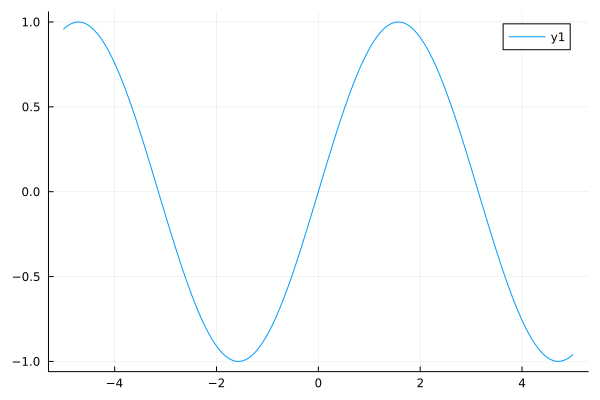

In [108]:
plt.plot(sin)

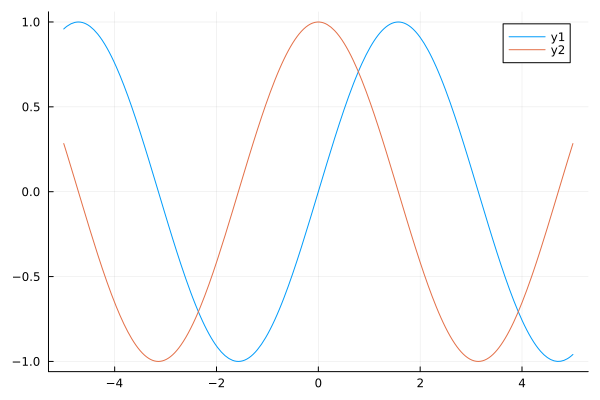

In [109]:
plt.plot([sin,cos])

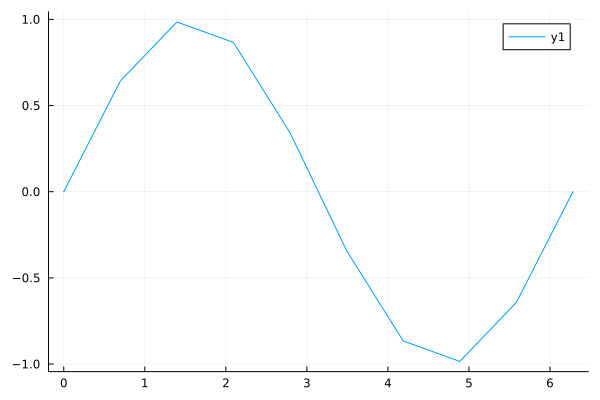

In [110]:
# Observe that with domain points x_i, a straight line is drawn 
#     between points (x_i,f(x_i)) and (x_i+1,f(x_i+1))
plt.plot(range(0,2pi,length=10),sin)

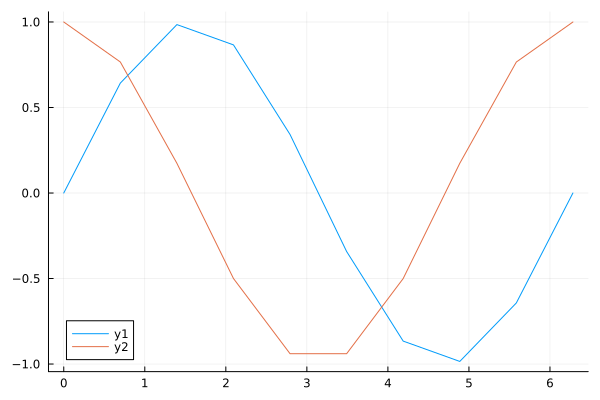

In [111]:
plt.plot(range(0,2pi,length=10),[sin,cos])

* **Data**: `plt.plot(y)` plots vector `y` as straight lines between points `(i,y_i)` and `(i+1,y_i+1)`, with `i` as abscissa values. `plt.plot(x,y)` plots a straight line between points `(x_i,y_i)` and `(x_i+1,y_i+1)`, with `x_i` as abscissa values.
  - **Multiple vectors**: `plt.plot(vy)` where `vy` is a vector of vectors, plots all vectors in `vy` with vector index as abscissa value. `plt.plot(x,vy)`, where `x` and all data vectors in vector `vy` have the same number of elements, plots all vectors with `x` as abscissa value.
  - **Matrix**: `plt.plot(my)` plots each column vector in matrix `my` as a vector with row index as abscissa. `plt.plot(x,my)` where `x` is a vector with the same number of elements as the rows of `my`, plots the column vectors of `my` with `x` as abscissa value.

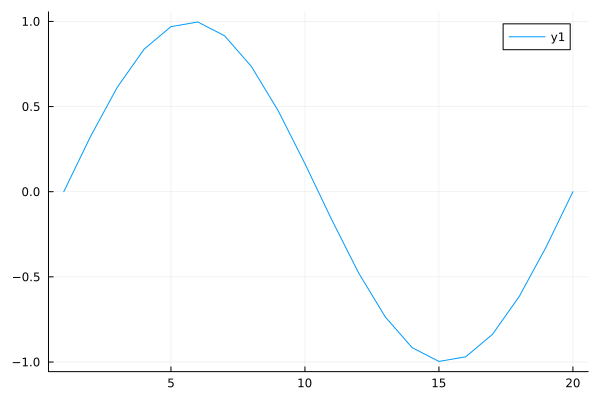

In [112]:
x = range(0,2pi,length=20)
y = sin.(x)    # Constructs data vector
#
plt.plot(y)

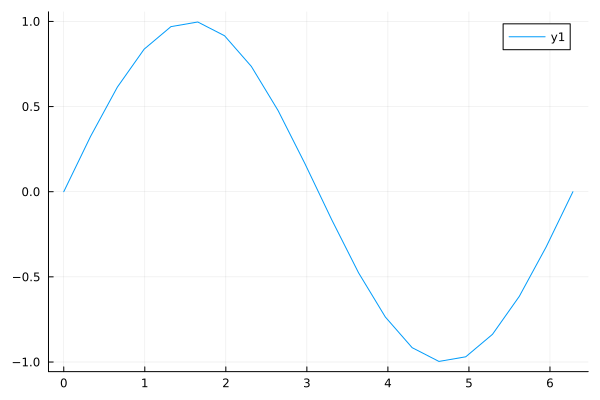

In [113]:
plt.plot(x,y)

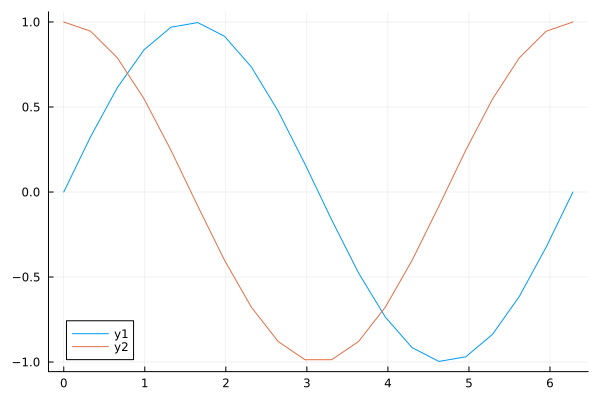

In [114]:
z = cos.(x)
plt.plot(x,[y,z])

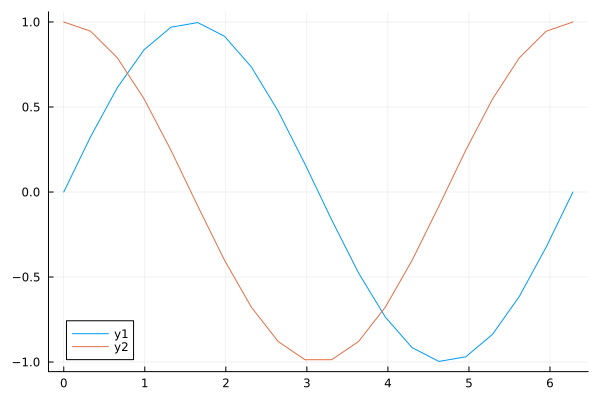

In [115]:
my = reduce(hcat,[y,z])    # Creates a matrix with `y` and `z` as 
                           # columns 1 and 2, respectively
plt.plot(x,my)

**Observe**: The `Plots` package automatically chooses line color, line width, line style, and adds labels for each plot.

* **Adding plots to a plot**: function `plt.plot(...)` creates a new plot window. The *mutating* function `plt.plot!(...)` adds plot to the latest created plot.

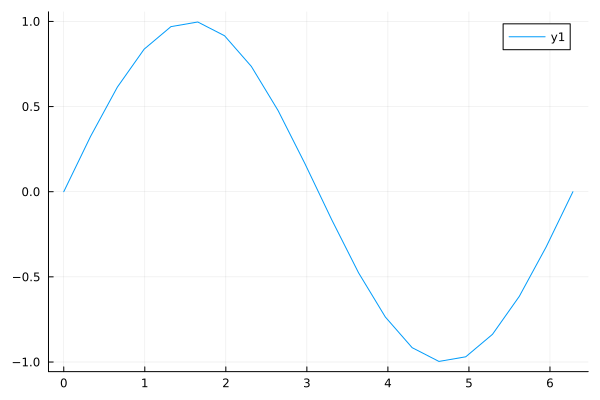

In [116]:
plt.plot(x,y)

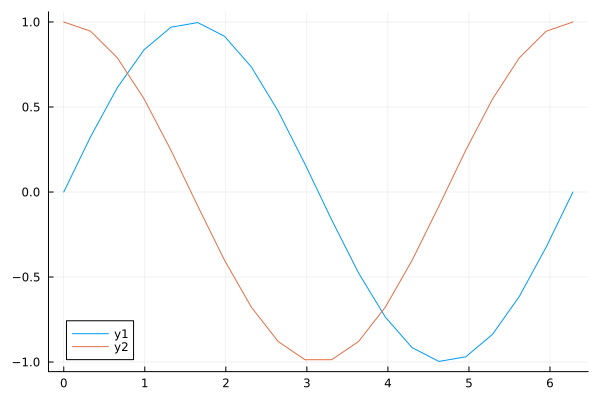

In [117]:
plt.plot!(x,z)

* **Named plots**: a plot can be named, e.g., `p_name = plt.plot(...)`. The *mutating* function can then be used to add plots to a named plot: `plt.plot!(p_name,...)`.

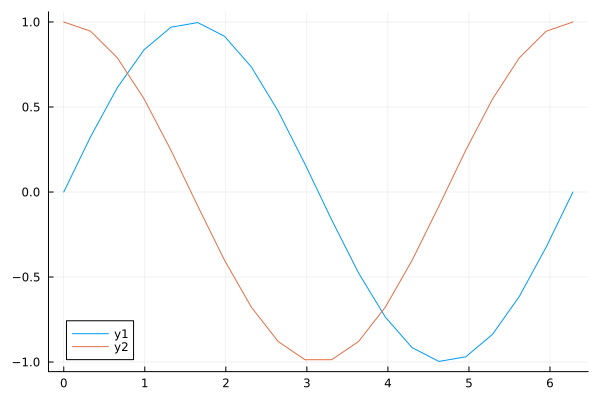

In [118]:
p1 = plt.plot(x,y)
p2 = plt.plot(x,z)
plt.plot!(p1,x,z)

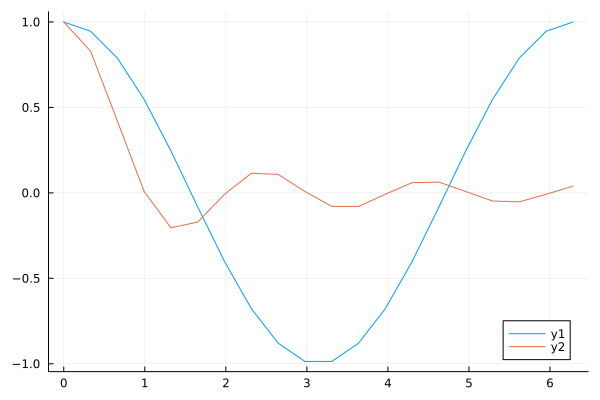

In [119]:
plt.plot!(p2,x,sinc.(x))

* **Combining several named plots in one plot**: `plot(pf1,pf2,...)` will make a matrix layout of plots `pf1`, `pf2`, .... Optionally, keyword `layout` can be used to specify a matrix layout in a tuple. Even more complex layout can be specified, see the documentation for `Plots.jl`.

  * **Linking axes**: keyword `link` can be given values `:none` (default), `:both`, `:all`, `:x`, `:y`. With value `:x`, plots in the matrix are linked by *column*, i.e., all plots in the same column get the same domain range. With value `:y`, plots in the matrix are linked by *row*, i.e., all plots in the same row get the same range.

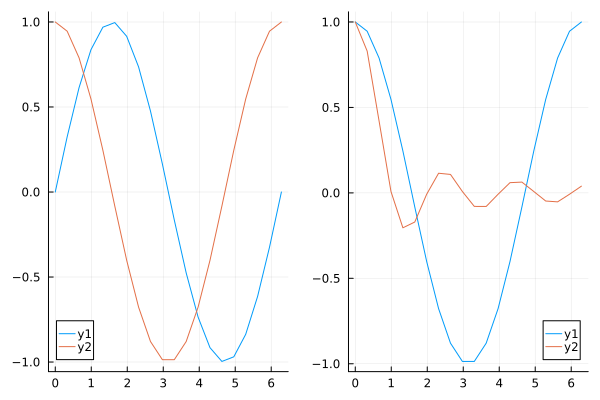

In [120]:
plt.plot(p1,p2)

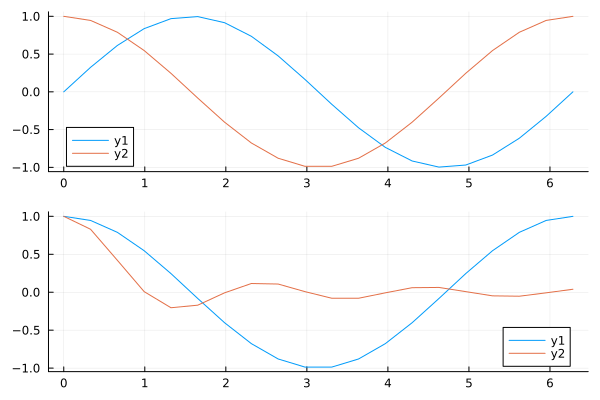

In [121]:
plt.plot(p1,p2; layout=(2,1))

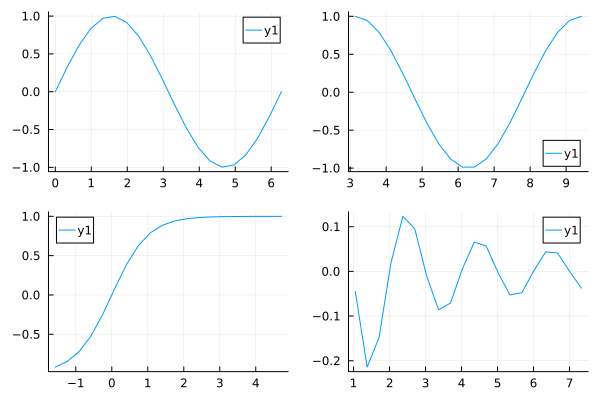

In [122]:
P1 = plt.plot(x,sin.(x))
P2 = plt.plot(x.+pi,cos.(x))
P3 = plt.plot(x.-pi/2,tanh.(x.-pi/2))
P4 = plt.plot(x.+pi/3,sinc.(x.+pi/3))
plt.plot(P1,P2,P3,P4)

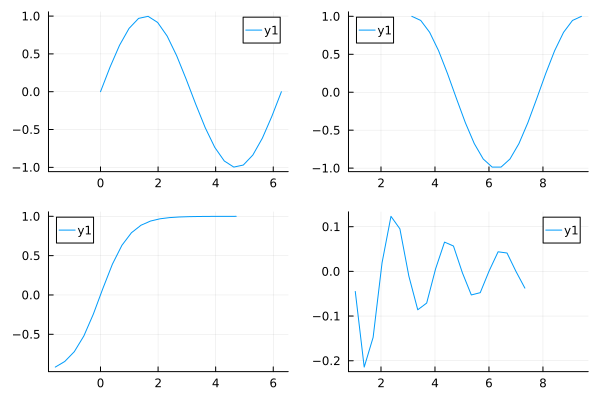

In [123]:
plt.plot(P1,P2,P3,P4; link=:x)

* **Adding insets to plots**: keyword `inset` must be given a value via function `bbox` with a quadruple (tuple) of arguments. "Origo" in plots are the upper left corner of the plot. Arguments of `bbox`: (i) fractional y-position of inset plot, (ii) fractional x-position of inset plot, (iii) fractional y-scaling of inset plot, (iv) fractional x-scaling of inset plot. Keyword `inset` must be followed by keyword `subplot`, which should be given value `2`. More keywords are available for function `bbox`, and other choices for keyword `subplot` are relevant to insert the inset into subplots.

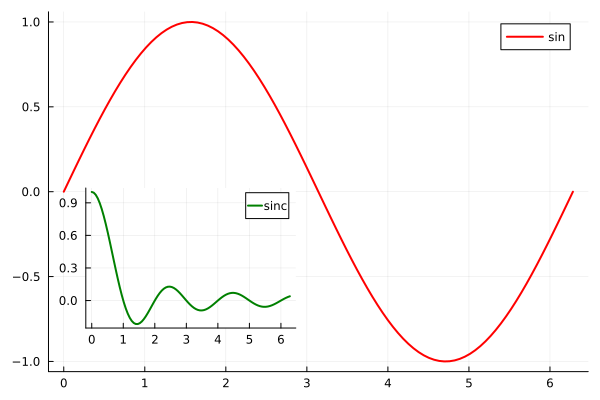

In [124]:
xr = range(0,2pi,length=100)
plt.plot(xr,sin.(xr),lw=2,lc=:red,label="sin")

plt.plot!(
    xr,sinc.(xr),lw=2,lc=:green,label="sinc",
    inset=plt.bbox(0.143,0.47,0.35,0.35),
    subplot=2
)

* **Specifying the size of plots**: keyword `size` with a pair (tuple) of (i) with, and (ii) height. 

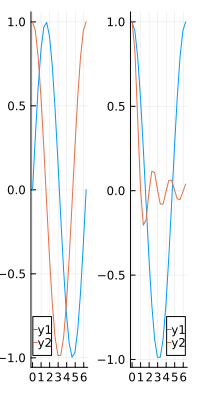

In [125]:
plt.plot(p1,p2; size=(200,400))

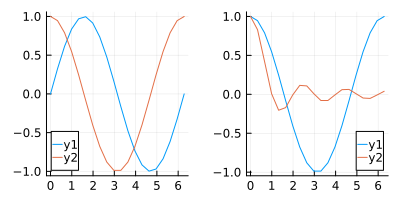

In [126]:
plt.plot(p1,p2; size=(400,200))

* **Creating plots in loops**: if plots are created in *loops*, the plot will not show up in a Jupyter notebook when the loop is finished. To show the plot, simply issue command `plot!()` *after* the loop.

* **Storing plots to file**: function `savefig(filename)` saves the active plot to `filename` (i.e., assuming the `savefig` function is applied just after a `plot` function has been used). Several file formats are possible, given by the file extension in the file name, e.g., `svg` (scalable vector graphics, which is the native format of free drawing tool `Inkscape`), `pdf`, `png`, etc.
  * Alternatively, if a plot has been associated with identifier `pname`, this plot can be saved using syntax `savefig(pname,filename)`.

It is recommended to specify a (`constant`?) identifier for the path to the directory where you want to put the files, and then a separate (local) filename for each plot that you want to save. The `filename` is then constructed as the (string) concatenation of the two strings.

In [127]:
figpath = "c://users/Bernt_Lie/desktop/"
figname = "fig_test.svg"
plt.savefig(figpath*figname)
;

## Colors
### Colors specified by colorant string
Colors may be specified by a *string modifier* `colorant`, i.e., `colorant"..."`, where the string consists of either a valid HTML color (case *insensitive*) or a hexadecimal number of 2 digits for each of colors Red, Green, and Blue.

See, e.g., https://www.w3schools.com/colors/colors_names.asp or https://www.w3schools.com/colors/colors_groups.asp for HTML color names. See http://juliagraphics.github.io/Colors.jl/stable/namedcolors/ for specifics.

The hexadecimal number is indicated by hash symbol `#` in front of the 6 hexadecimal digits, e.g., "#abcdef" where ab is the hex number for the Red color (equivalent to an integer in the interval $\left\{ 0,\ldots,255\right\}$ ), cd is the hex number for the Green color ($\left\{ 0,\ldots,255\right\}$ ) and ef is the hex number for the Blue color ($\left\{ 0,\ldots,255\right\}$ )

In [128]:
my_red = plt.colorant"red"
my_purple = plt.colorant"#4646A5"
my_gold = plt.colorant"#FFD240"
[my_red, my_purple,my_gold]

In [129]:
[plt.colorant"MidnightBlue", plt.colorant"cornflowerBlue"]

In [130]:
plt.colorant"#eeab32"

### Color profile of USN 2018--2023


In [131]:
# Main colors
[plt.colorant"#4646A5", plt.colorant"#3BAFA2"]

In [132]:
# Support colors -- complements the main colors, and are used to distinguish 
# between data in graphs and tables
#
[plt.colorant"#9AD4E2", plt.colorant"#00978A",plt.colorant"#9DD29F", plt.colorant"#0F76AF",plt.colorant"#FFD240", 
    plt.colorant"#D64349",plt.colorant"#27B2D0"]

In [133]:
# Additional colors, to be used for backgrounds, etc.
[plt.colorant"#e6f0f0", plt.colorant"#F2F2F2", plt.colorant"#C8D7D7", 
plt.colorant"#596F6C"]

It is possible to use, e.g., the color Eyedropper in MS PowerPoint to find approximate HTML names for the colors.

### Color profile of USN 2023--
See https://brandpad.io/usn [in Norwegian].

The guidelines state that the overall color impression should be purple (and indigo). The second color that should complement purple, is orange -- leading to a fresh overall impression. The strongest colors (orange, pink, acid green) should only be used for small elements, and not for background. For background/large spaces, light purple/indigo and beige should be used. 

In [134]:
# Main colors:
# -- purple
col_usn_pu_1 = plt.colorant"#7800f0"
col_usn_pu_2 = plt.colorant"#9359ef"
col_usn_pu_3 = plt.colorant"#cdb9fc"
# -- indigo
col_usn_in_1 = plt.colorant"#2f0b63"
col_usn_in_2 = plt.colorant"#9595f9"
col_usn_in_3 = plt.colorant"#dad9ff"
#
[col_usn_pu_1,col_usn_pu_2,col_usn_pu_3,col_usn_in_1,col_usn_in_2,col_usn_in_3]

In [135]:
# Second color level: freshen up + background
col_usn_or = plt.colorant"#ff6202"
col_usn_be_1 = plt.colorant"#ffd9b1"
col_usn_be_2 = plt.colorant"#ffebd3"
col_usn_be_3 = plt.colorant"#fff5ee"
#
[col_usn_or,col_usn_be_1,col_usn_be_2,col_usn_be_3]

In [136]:
# Third color level: strengthened impression 
col_usn_pi_1 = plt.colorant"#ef7dbb"
col_usn_pi_2 = plt.colorant"#ffcced"
col_usn_ag_1 = plt.colorant"#cfff1f"
col_usn_ag_2 = plt.colorant"#e4ff7d"
#
[col_usn_pi_1,col_usn_pi_2,col_usn_ag_1,col_usn_ag_2]

### Definition of colors via ColorTypes
Some useful types are RGB/RGBA, HSV/HSVA, HSL/HSLA, and Gray/GrayA, where the A indicates support for alpha-channel (transparency) specification.

**RGB** (Red, Green, Blue) has three arguments, each in the range [0,1] indicating zero to full color of each of Red, Green, and Blue. For **RGBA** (RGB + Alpha-channel), a fourth argument in range [0,1] indicates level of transparency.

In [137]:
[plt.RGB(0.2,0.3,0.5), plt.RGB(0.4,0.6,1)]

In [138]:
plt.RGBA(0.2,0.3,0.5,0.7)

**HSV** (Hue, Saturation, Value) has three arguments, in the range [0,360], [0,1], [0,1], respectively. For **HSVA** (HSV + Alpha-channel), a fourth argument in range [0,1] indicates level of transparency.

In [139]:
[plt.HSV(20,0.2,0.3),plt.HSV(120,0.2,0.3),plt.HSV(20,0.4,0.6)]

In [140]:
plt.HSVA(120,0.2,0.3,0.5)

**HSL** (Hue, Saturation, Lightness) has three arguments, in the range [0,360], [0,1], [0,1], respectively. For **HSLA** (HSV + Alpha-channel), a fourth argument in range [0,1] indicates level of transparency.

In [141]:
[plt.HSL(20,0.2,0.3),plt.HSL(120,0.2,0.3),plt.HSL(20,0.4,0.6)]

In [142]:
plt.HSLA(120,0.2,0.3,0.5)

**Gray** (Gray scale) has one argument, in the range [0,1]. For **GrayA** (Gray + Alpha-channel), a second argument in range [0,1] indicates level of transparency.

In [143]:
[plt.Gray(0.2),plt.Gray(0.7)]

In [144]:
plt.GrayA(0.2,0.3)

### Color conversion
It is possible to  convert between different color types using the instantiator, e.g.:
```julia
col = colorant"red"
col_gray = Gray(col)
```
Using function `hex()`, it is possible to extract the `hex` string of the color.

In [145]:
col = plt.colorant"red"
col_gray = plt.Gray(col)

In [146]:
plt.hex(col)

"FF0000"

In [147]:
plt.hex(col_gray)

"4C4C4C"

### Color ranges

In [148]:
range(plt.colorant"orange",plt.colorant"cornflowerblue",length=7)

### Color maps
A few predefined *colormaps* exists in package `Colors.jl`, and these can be instantiated using function `colormap`:
```julia
colormap(cname::String [, N::Int=100; mid=0.5, logscale=false, kvs...]
```
where `cname` is one of the predefined sequential colormaps `Blues`, `Greens`, `Grays`, `Oranges`, `Purples`, `Reds`, or the diverging colormap `RdBu`. Here, `N` is the number of colors in the created vector of colors. `logscale = true` shifts the gradient of the color change to the right.

[Package `Colors.jl` contains functions `sequential_palette` and `diverging_palette` for creating userdefined color mapes.]

In [149]:
# Sequential colormap
my_col = plt.colormap("Blues")

In [150]:
# my_col is different from what we would get with the `range` function
range(my_col[1],my_col[end],length=100)

In [151]:
# Sequential colormap, logscale
plt.colormap("Blues"; logscale=true)

In [152]:
# Diverging colormap
plt.colormap("RdBu",10)

### Distinguishable colors
Often, we need a number of colors, and we want them to be as easy to distinguish as possible; see http://juliagraphics.github.io/Colors.jl/stable/colormapsandcolorscales/#Generating-distinguishable-colors.

A basic syntax is:
```julia
distinguishable_colors(N,seed; dropseed=false)
```
where `N` is the number of different colors, and `seed` is an optional argument consisting of a seed *color*, or a *vector* of *seeds of colors*. A number of additional keyword arguments are available, e.g., `dropseed` which - if `true` - ensures that the seed colors are *not* included in the resulting color vector.

The result is a vector of colors.

In [153]:
plt.distinguishable_colors(5)

In [154]:
plt.distinguishable_colors(5,plt.colorant"blue")

In [155]:
plt.distinguishable_colors(5,plt.colorant"blue"; dropseed=true)

In [156]:
plt.distinguishable_colors(5,[plt.colorant"blue",plt.colorant"red"])

In [157]:
plt.distinguishable_colors(5,[plt.colorant"blue",plt.colorant"red"]; 
    dropseed=true)

### Color gradients
Continuous color gradients are created using function `cgrad()`, which in a basic form has the following calling structure:
```julia
cgrad(colors; scale=nothing,rev=false,alpha=nothing)
```
Here, `colors` is either a vector of color values (e.g., `[colorant"red", colorant"blue"]`), or a built in symbol representing color values.

Valid built in symbols include:
`:Spectral`, `:RdYlGn`, `:RdBu`, `:PiYG`, `:PRGn`, `:RdYlBu`, `:BrBG`, `:RdGy`, `:Set2`, `:Accent`, `:Set1`, `:Set3`, `:Dark2`, `:Paired`, `:Pastel2`, `:Pastel1`, `:PuOr`, `:OrRd`, `:PuBu`, `:BuPu`, `:Oranges`, `:BuGn`, `:YlOrBr`, `:YlGn`, `:Reds`, `:RdPu`, `:Greens`, `:YlGnBu`, `:Purples`, `:GnBu`, `:Greys`, `:YlOrRd`, `:PuRd`, `:Blues`, `:PuBuGn`, `:bgy`, `:bgyw`, `:bjy`, `:bkr`, `:bky`, `:blues`, `:bmw`, `:colorwheel`, `:dimgreys`, `:fire`, `:greys`, `:gwv`, `:cinferno`, `:isolum`, `:kb`, `:kdc`, `:kg`, `:kgy`, `:kr`, `:diverging`, `:cyclic1`, `:cyclic2`, `:cyclic3`, `:blues`, `:reds`, `:greens`,  `:redsblues`, `:bluesreds`, `:heat`, `:grays`, `:rainbow`, `:lightrainbow`, `:darkrainbow`, `:darktest`, `:lighttest`, `:cividis`

Optional keyword argument `scale` admits values `nothing` (default), `:log`, `:log10`, `:log2`, `:ln`, `:exp`, `:exp10`.

Optional keyword argument `rev` (reverse) is of type `Bool` (`true` or `false`).

Optional keyword `alpha` admits values `nothing` (default) or a float in the range `[0,1]`).

We can *suppress* a color bar in plots by setting `colorbar = false`.

#### Built-in color schemes

In [158]:
plt.cgrad(:Spectral)

In [159]:
plt.cgrad(:Spectral;scale=:exp)

In [160]:
plt.cgrad(:Spectral;rev=true)

#### User defined color scheme

In [161]:
my_colgrad = plt.cgrad([my_purple,my_gold,:red])

In [162]:
my_colgrad = plt.cgrad([my_purple,my_gold,:red];scale=:exp,rev=true)

In [163]:
my_colgrad = plt.cgrad([col_usn_in_1,col_usn_ag_1,col_usn_or])

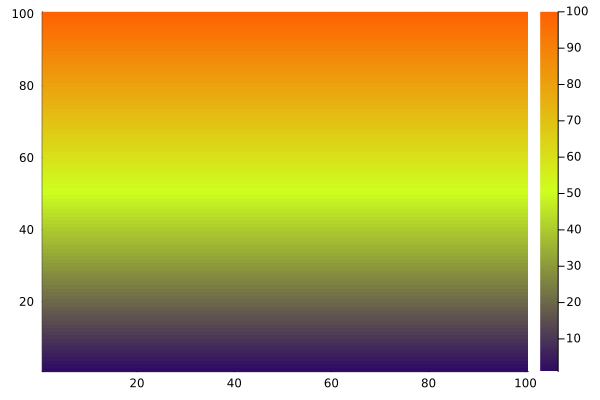

In [164]:
A = [i for i=1:100, j=1:100]

mymap = plt.heatmap(A, c=my_colgrad)

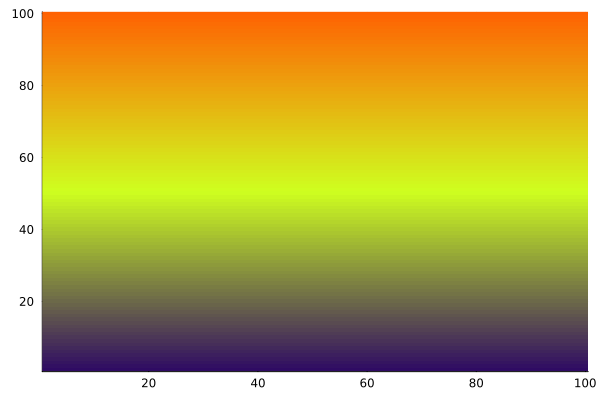

In [165]:
mymap = plt.heatmap(A, c=my_colgrad, colorbar=false)

## Series type
The `plot` function has keyword `seriestype` or `st` for short; http://docs.juliaplots.org/latest/generated/attributes_series/. Options are `:none`, `:line`, `:path` (default), `:steppre`, `:steppost`, `:sticks`, `:scatter`, `:heatmap`, `:hexbin`, `:barbins`, `:barhist`, `:histogram`, `:scatterbins`, `:scatterhist`, `:stepbins`, `:stephist`, `:bins2d`, `:histogram2d`, `:histogram3d`, `:density`, `:bar`, `:hline`, `:vline`, `:contour`, `:pie`, `:shape`, `:image`, `:path3d`, `:scatter3d`, `:surface`, `:wireframe`, `:contour3d`, `:volume`, `:mesh3d`.

In the case of plotting an object, it is possible to specify multiple series types listed in a *vector*. This produces one plot of the object for each seriestype.

In case of multiple plotted objects in one figure, it is possible to specify multiple series types listen in a *row matrix* assigned to the keyword. If there are $n_f$ plotted functions and $n_s$ series types specified: with $n_f \le n_s$, the first $n_f$ series types will be used. If $n_f < n_s$, $n_s$ series types will be used, and then starting from the start again.

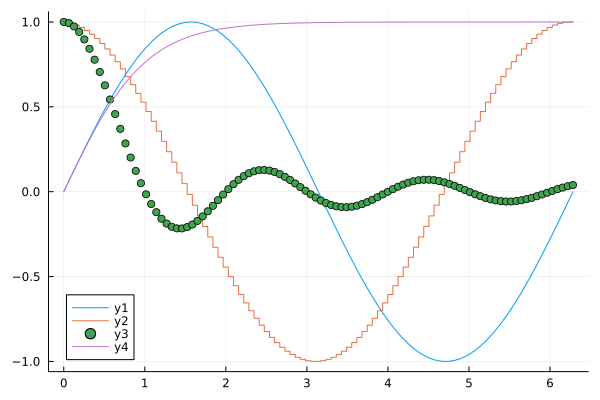

In [166]:
x = range(0,2pi,length=100)
plt.plot(x,[sin,cos,sinc,tanh];st=[:path :steppre :scatter])

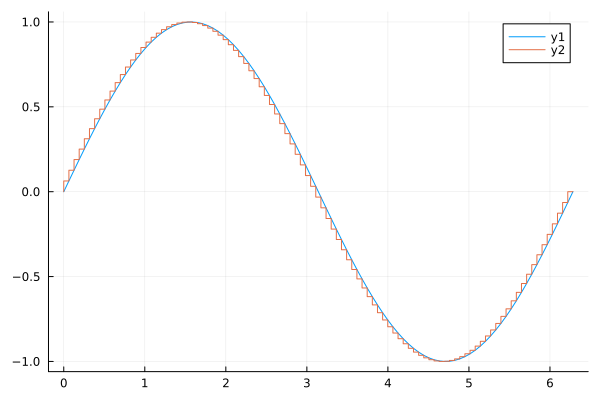

In [167]:
plt.plot(x,sin; st=[:path,:steppre])

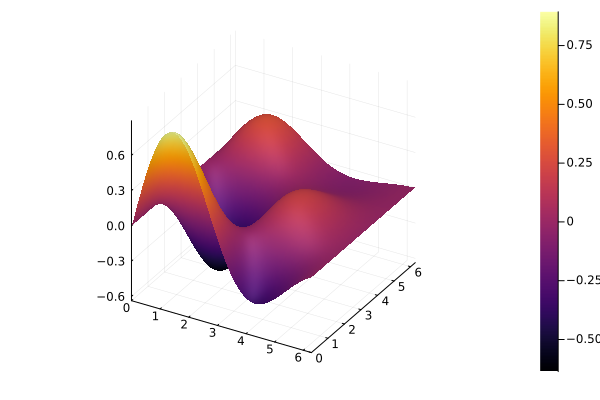

In [168]:
y = range(0,2pi,length=100)
f(x,y) = sin(x)*cos(y)*exp(-x^2/20 - x*y/40 - y^2/40)
plt.plot(x,y,f; st=:surface)

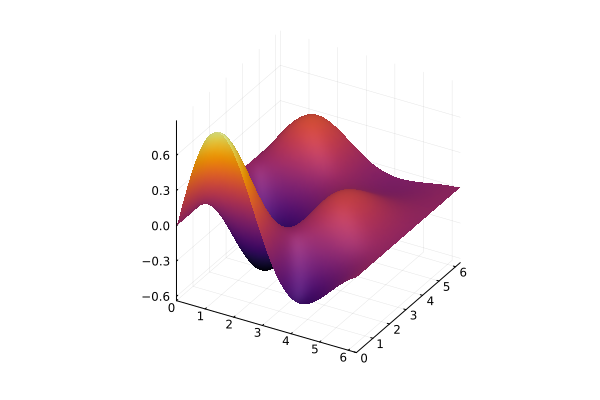

In [169]:
y = range(0,2pi,length=100)
f(x,y) = sin(x)*cos(y)*exp(-x^2/20 - x*y/40 - y^2/40)
plt.plot(x,y,f; st=:surface, colorbar=:false)

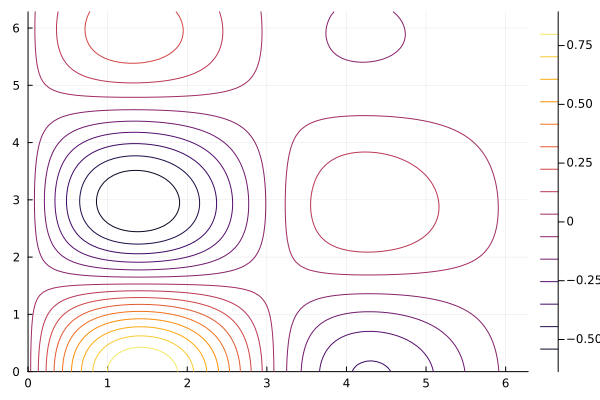

In [170]:
plt.plot(x,y,f; st=:contour)

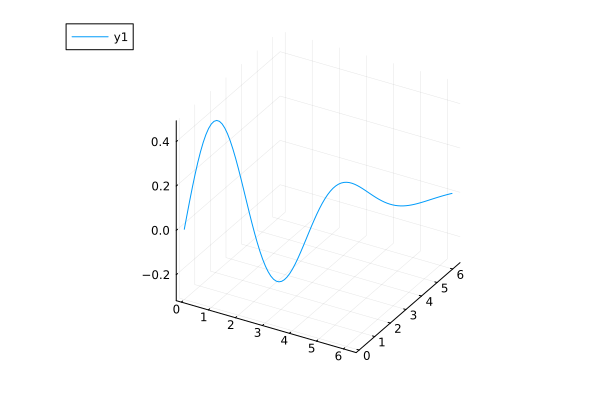

In [171]:
plt.plot(x,y,f.(x,y); st=:path3d)    # Does not allow function as input, 
                                     # but vectors: `f.(x,y)` produces a 
                                     # vector

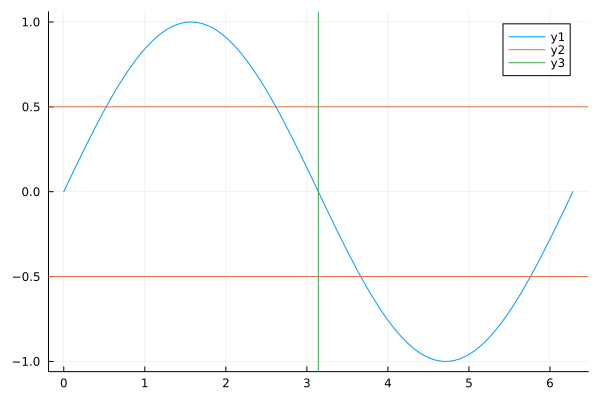

In [172]:
plt.plot(x,sin)
plt.plot!([-0.5,0.5],st=:hline)
plt.plot!([pi],st=:vline)

Note: series types `hline` and `vline` have convenience functions where `plot(...,st=hline,...)` can be replaced with `hline(...)` and `plot!(...,st=hline,...)` can be replaced with `hline!(...)`; similarly for series type `vline`. 
## Lines
### Line style
Line style is specified with keyword `linestyle` or `ls`. Possible choices are `:auto`, `:solid` (default), `:dash`, `:dot`, `:dashdot`, `:dashdotdot`.

### Line width
Line width is specified with keyword `linewidth`, `lw`, and is specified as a floating point number in *pixels*. Default value is `:auto`.

### Line color
Line color is specified with keyword `linecolor`, `linecolour`, `lc`. Possible choices are colors, as defined in the previous section. Colorant strings can be replaced by the color name as a symbol (e.g., `:red` instead of `colorant"red"`).

It is also possible to specify the line color to be a *color gradient*. If so, an additional keyword `line_z` must be added, and set equal to a vector of the same size as `x`/`y`. This will produce a "parameter" bar, which shows the color vs. the value of the "parameter". Using a color gradient may be useful, e.g., in parametric plots, to indicate the flow of the parameter.

### Line alpha
Line alpha value is specified with keyword `linealpha` or `la`, and is specified as a floating point number in range `[0,1]` where `0` is completely transparent and `1` is completely opaque.

### Vector and matrix of line specifications
When plotting a series of type `:path`, `:steppre`, etc., this is done by drawing straight lines between given data points. It is possible to alternate between line specifications for each line segment by specifying the line property as a **vector** of line properties. In that case, each line segment will be given the line property in the order given by the property vector (`linestyle`, `linewidth`, etc.), while re-starting from the beginning of the property vector if there are more segments than elements in the property vector. This possibility may sometimes be useful.

When plotting several series in one function call, if the line property is given as a *row vector*, this specifies the property of each series.

In principle, it is also possible to specify the line properties as matrices. In that case, the columns will provide the variation from segment to segment, while the rows will provide the variation from series to series.

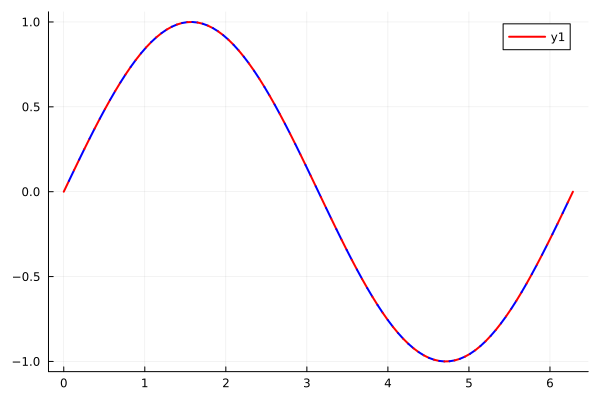

┌ Warning: Indices Base.OneTo(2) of attribute `linecolor` does not match data indices 1:100.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `linecolor` does not match data indices 1:100.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `linecolor` does not match data indices 1:100.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141


In [173]:
plt.plot(x,sin;lc=[:red,:blue],lw=2)

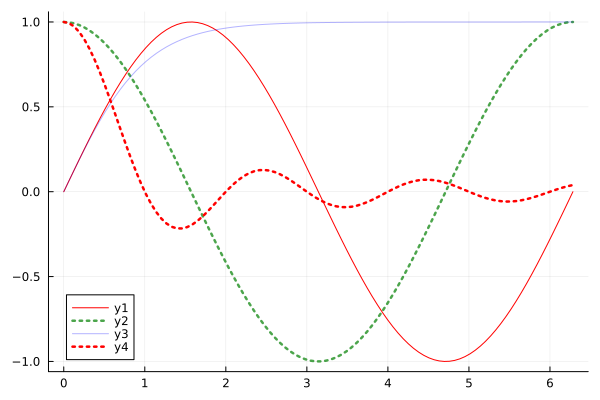

In [174]:
plt.plot(x,[sin,cos,tanh,sinc];ls=[:solid :dot],lw=[1 2.5], 
    lc=[:red :green :blue], la=[1 0.7 0.3])

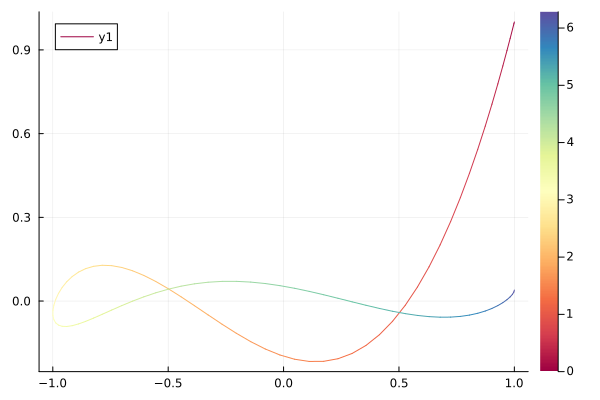

In [175]:
plt.plot(cos.(x),sinc.(x);lc=plt.cgrad(:Spectral),line_z=x)

## Markers
Markers are used to specify styles for markers in *scatter plots*. Scatter plots are invoked by series type `:scatter`. Alternatively, command `plot(...; st=:scatter)` can be invoked by the short-hand notation `scatter(...)`, or `scatter!(...)` in the case of a mutating plot. Scatter plots are typically used for experimental data/logged data to indicate that we do not know the value between samples.

### Marker shape
The marker shape is given with keyword `markershape`, `shape`. Possible choices are `:none`, `:auto`, `:circle` (default), `:rect`, `:star5`, `:diamond`, `:hexagon`, `:cross`, `:xcross`, `:utriangle`, `:dtriangle`, `:rtriangle`, `:ltriangle`, `:pentagon`, `:heptagon`, `:octagon`, `:star4`, `:star6`, `:star7`, `:star8`, `:vline`, `:hline`, `:+`, `:x`, `:^`, `:v`.

### Marker size
The marker size is given with keyword `markersize`, `ms`, and is specified as a floating point number in pixels.  

### Marker color
Marker color specifies the *face* of the marker and is specified with keyword `markercolor`, `markercolour`, `mc`. Possible choices are colors, as defined in the previous section. Colorant strings can be replaced by the color name as a symbol (e.g., `:red` instead of `colorant"red"`).

It is also possible to specify the marker color to be a color gradient. If so, an additional keyword `marker_z` should be added, and set equal to a vector of the same size as `x`/`y`. This will produce a "parameter" bar, which shows the color vs. the value of the "parameter". Using a color gradient may be useful, e.g., in parametric plots, to indicate the flow of the parameter.

### Marker alpha
The alpha channel value for the marker color is given with keyword `markeralpha`, `ma`. The specification is a floating point number in range [0,1] where 0 is completely transparent and 1 is completely opaque.

### Marker stroke color
Marker stroke color specifies the color of the line surrounding the marker face, and is specified with keyword `markerstrokecolor`, `markerstrokecolour`, `msc`. 

### Marker stroke alpha
The alpha channel value for the marker stroke color is given with keyword `markerstrokealpha`, `msa`. The specification is a floating point number in range [0,1] where 0 is completely transparent and 1 is completely opaque.

### Marker stroke style
Keyword `markerstrokestyle` can be set to any of `:auto`, `:solid` (default), `:dash`, `:dot`, `:dashdot`, `:dashdotdot`. 

### Marker stroke width
Keyword `markerstrokewidth`, `msw` is specified as a floating point number in *pixels*. Default value is `1`.

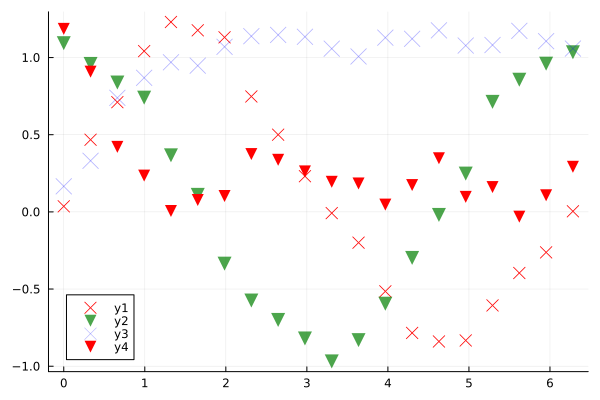

In [176]:
nx = 20
x = range(0,2pi,length=nx)
y1 = sin.(x) + 0.3*rand(nx)
y2 = cos.(x) + 0.2*rand(nx)
y3 = tanh.(x) + 0.2*rand(nx)
y4 = sinc.(x) + 0.3*rand(nx)
plt.plot(x,[y1,y2,y3,y4];st=:scatter,shape=[:x :dtriangle],ms=[6 7 8], 
    mc=[:red :green :blue], ma=[1 0.7 0.3], msc=[:red :green :blue])

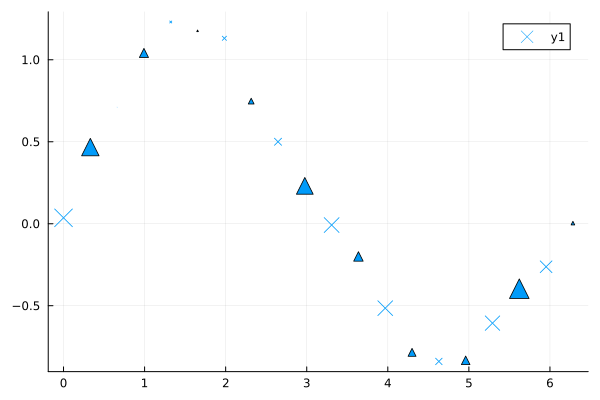

┌ Warning: Indices Base.OneTo(2) of attribute `markershape` does not match data indices 1:20.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `markershape` does not match data indices 1:20.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `markershape` does not match data indices 1:20.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `markershape` does not match data indices 1:20.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `markershape` does not match data indices 1:20.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils.jl:141
┌ Warning: Indices Base.OneTo(2) of attribute `markershape` does not match data indices 1:20.
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\utils

In [177]:
plt.plot(x,y1;st=:scatter,ms=10*rand(nx),shape=[:x,:^])

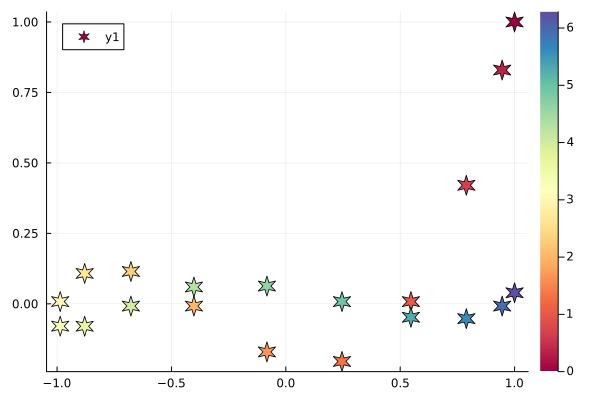

In [178]:
plt.scatter(cos.(x),sinc.(x);shape=:star6,ms=10,
    mc=plt.cgrad(:Spectral),msc=false,marker_z=x)

## Filled areas
### Polygons
Issueing command `plot(vertices)` where `vertices` is a vector of pairs (tuples) of abscissa and ordinate values, draws straight lines between the data points. Normal line description keywords are used to control the lines.

By changing the series type to type `:shape`, this produces a filled area in the enclosed points.

If `vertices` instead is given as a *tuple* of two vectors of equally many vertices (or a comma separated list of two such vectors), the plot command uses the ordinate-value of the first vector as abscissa value, and the ordinate-value of the second vector as ordinate, and draws straight lines between the given points. By adding series type `:shape`, a filled area is created.

As an alternative, a `Shape` object can be created using command `Shape(y,z)` where `y` and `z` are two equal-length vectors of vertices. If plotting a `Shape` object, the series type automatically becomes `:shape`, and is thus superfluous.

By judicial choice of the vertices, this may give shapes of arbitrary complexity.

### Fill color
Fill color is specified with keyword `fillcolor`, `fillcolour`, `fc`. Possible choices are colors, as defined in the previous section. Colorant strings can be replaced by the color name as a symbol (e.g., `:red` instead of `colorant"red"`).

### Fill alpha
The alpha channel value for the fill color is given with keyword `fillalpha`, `fa`. The specification is a floating point number in range [0,1] where 0 is completely transparent and 1 is completely opaque.


### Ribbon plots
When adding keyword `ribbon` to a plot of a series, this creates a filled area around the series value. Possible values for keyword `ribbon`are (i) a vector of the same size as the series, implying the filled area is limited by the series value *minus* the ribbon value, and the series value *plus* the ribbon value, (ii) a scalar which is broadcasted to the scalar multiplied by a unit vector of the same size as the series, and (iii) a tuple of two vectors of equal size as the series, with filled area given by the series value *minus* the first element of the tuple, and the series value *plus* the second element of the tuple.

Fill color and fill alpha can be specified as for other filled areas.

Ribbons are typically used to indicate uncertainty levels in plots.

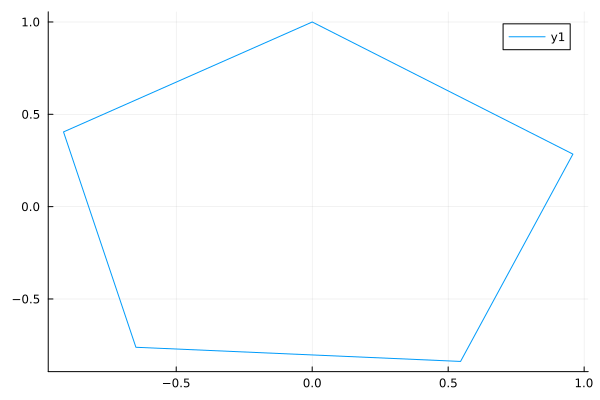

In [179]:
x = range(0,2pi,length=50)
n = 10
y = push!(sin.(x[1:n:end]),sin(x[end]))
z = push!(cos.(x[1:n:end]),cos(x[end]))
plt.plot(y,z)

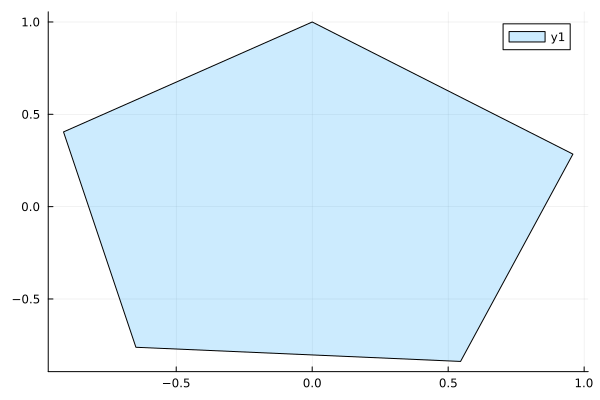

In [180]:
plt.plot(y,z;st=:shape, fa=0.2) # Use `fa=0.2` to reduce printer toner usage

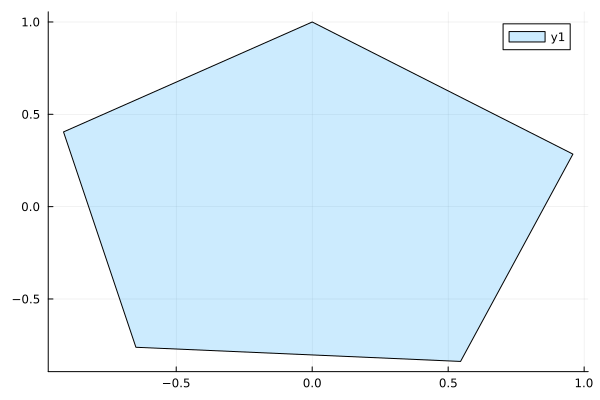

In [181]:
plt.plot((y,z);st=:shape, fa=0.2)

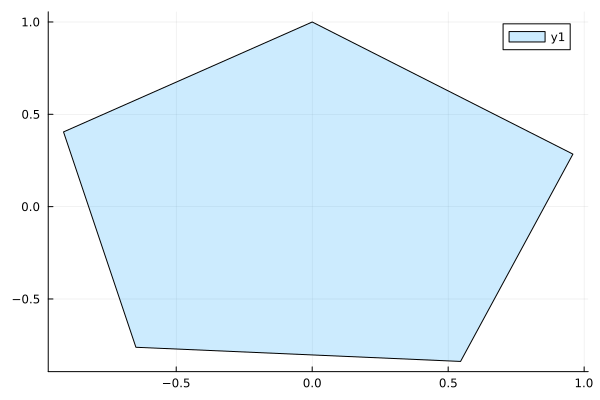

In [182]:
plt.plot(plt.Shape(y,z), fa=0.2)

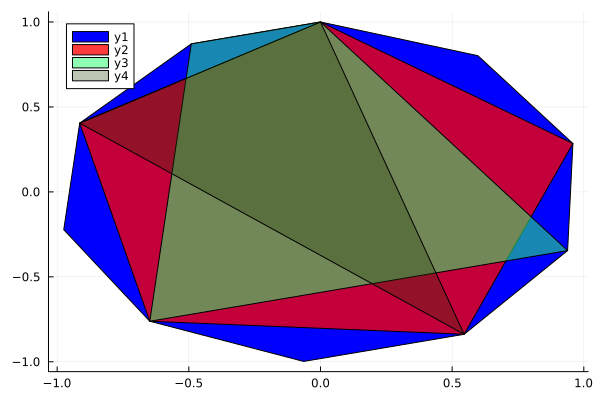

In [183]:
plt.plot()
N = 5:5:20
COL = plt.distinguishable_colors(length(N),
    [plt.colorant"blue",plt.colorant"red"])
ALPHA = range(1,0.3,length=length(N))
i=1
for n in N
    y = push!(sin.(x[1:n:end]),sin(x[end]))
    z = push!(cos.(x[1:n:end]),cos(x[end]))
    plt.plot!(y,z;st=:shape,fc=COL[i],fa=ALPHA[i])
    i += 1
end
plt.plot!()

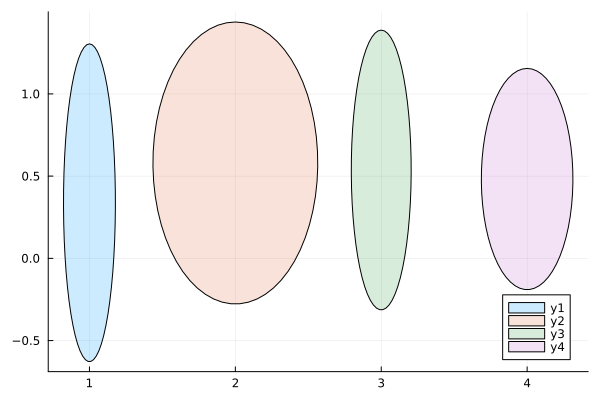

In [184]:
ang = range(0, 2π, length = 60)
# `ellipse `returns a Shape object
ellipse(x, y, w, h) = plt.Shape(w*sin.(ang).+x, h*cos.(ang).+y) 
myshapes = [ellipse(x,rand(),rand(),rand()) for x = 1:4]
plt.plot(myshapes,fa=0.2)

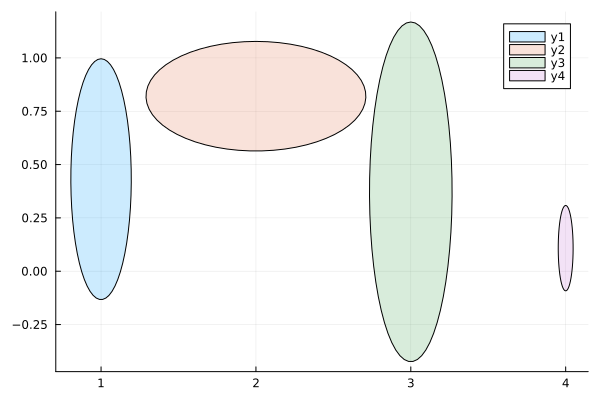

In [185]:
ang = range(0, 2π, length = 60)
ellipse(x, y, w, h) = w*sin.(ang).+x, h*cos.(ang).+y    # Returns a tuple
myshapes = [ellipse(x,rand(),rand(),rand()) for x = 1:4]
plt.plot(myshapes,st=:shape, fa=0.2)

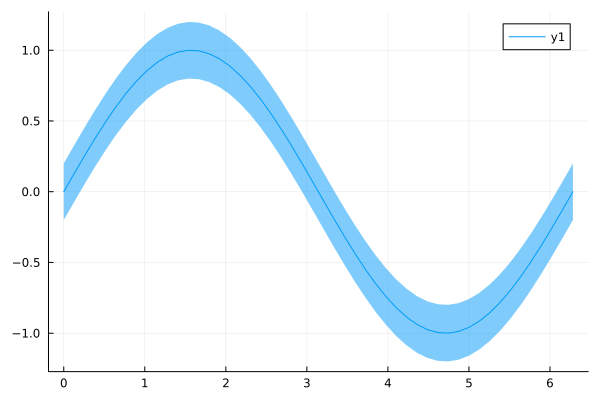

In [186]:
plt.plot(x,sin;ribbon=0.2)

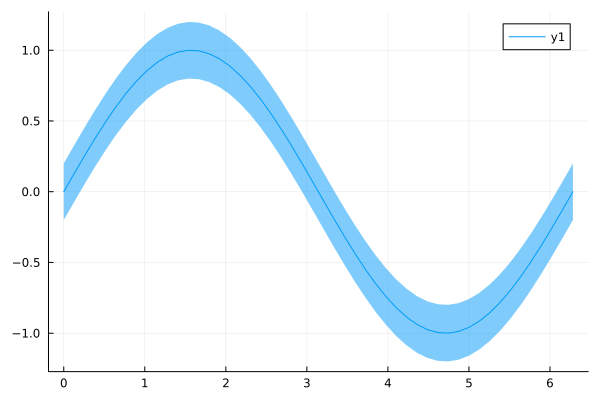

In [187]:
unit_x = ones(length(x))
plt.plot(x,sin;ribbon=0.2*unit_x)

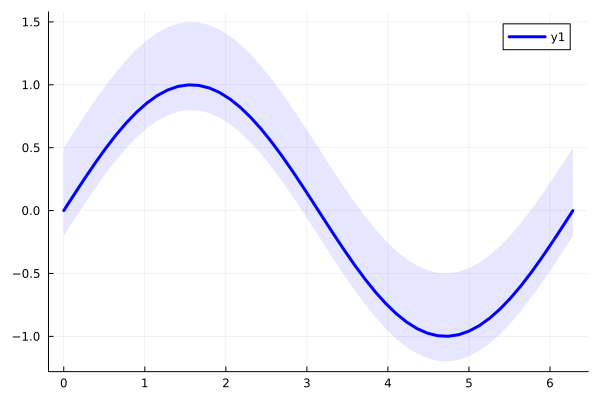

In [188]:
plt.plot(x,sin;ribbon=(0.2*unit_x,0.5*unit_x), lc=:blue,lw=3,fc=:blue,fa=0.1)

## Text
Text may be entered in plot title (keyword `plot_title` for plot, keyword `title` for subplots), axes guides (keywords `xguide`, `xaxis`, `xlabel`; `yguide`, `yaxis`, `ylabel`; possibly `zguide`, `zaxis`,`zlabel`), axes information (`tick` text), in labels for a legend box (`label`), in a title for the legend box, and possibly for text placed at given positions in the text.

### Font family, style, size, color
We can set common font parameters for all the above texts (see "Default plot settings"), or individual parameters for each text type. Let `§` be placeholder for the specific text element, e.g., `title`, `xlabel`, etc., then we can specify:
* **Font family**, keyword `§fontfamily` can be set to a string or symbol, e.g., `sans-serif`, `Computer Modern` (works for backend `GR`), etc. Example: `titlefontfamily`, `xlabelfontfamily`, etc.
* **Font size**, keyword `§fontsize` can be set to an *integer* font size measured in points.
* **Font color**, keyword `§fontcolor` can be set to a valid Julia color.
* **Font rotation**, keyword `§fontrotation` can be set to a real number measuring degrees rotation.
* **Font horizontal alignment**, keyword `§fonthalign` can be set to any of `:hcenter` (default), `:left`, `:right`, or `:center`.
* **Font vertical alighment**, keyword `§fontvalign` can be set to any of `:vcenter` (default), `:top`, `:bottom`, or `:center`. 

### LaTeX typesetting
$\LaTeX$ math can be typeset using standard $\LaTeX$ code in text strings. *However*, it must be remembered that both symbol `$` and `\` have special meaning in Julia (`$` is string interpolation, and `\` is "escape" character, respectively). When using these symbols, it is therefore necessary to add `\` as an escape character in front of these characters in $\LaTeX$ code. In other words, e.g., `$\sin(x)$` must be written as `\$ \\sin(x) \$` in the string.

Package `LaTeXStrings` makes it simpler to write $\LaTeX$ strings in Julia. It is recommended to import this package via `using LaTeXStrings` (and *not* via `import LaTeXStrings`)  as this makes writing $\LaTeX$ code simpler. As an example, `L"\sin(x)"` provides sinus function typesetting - the `L` modifier inserts the $\LaTeX$ operator `$`. It is also possible to combine text and math, as in `L"Function $\sin(x)$"`. Here, the string modifier `L` ensures that the `LaTeXStrings` package expands this to `"Function \$ \\sin(x) \$"` without user intervention. 

The only "problem" with the `LaTeXStrings` package is that LaTeX symbol `$` collides with the use of symbol `$` as a string interpolant (substitution). The solution to this problem is to use `%$` as string interpolant symbol in `LaTeXStrings`. Thus, the following should work:

`T = 65`

`L"T = %$(T)"`

## Annotation
### Title and guides/axis labels
Plot title text is specified as a string to keyword `plot_title`. This is the overall title of the plot. When we compose the overall plot via subplots, the title of the subplots can be specified via keyword `title`. When there is only a single subplot, it is possible to use `title` instead of `plot_title`.

Abscissa axis guide label is specified as a string to keyword `xguide` (alternatives: `xaxis`, `xlabel`), ordinate axis guide label is specified as a string to keyword `yguide`(`yaxis`, `ylabel`). In 3D plots, the third guide axis label is specified as a string to keyword `zguide` (`zaxis`, `zlabel`).

Font family, etc. may be specified by replacing placeholder `§` in font family, font size, font color, font rotation, and font alignments with `title`, `xguide`, `yguide`, and `zguide`, respectively. Some of the specifications are only valid for certain backends.

### Labels, legends
Labels for each series are by default given an automatic value (`y1`, `y2`, etc.). The label can be suppressed by setting keyword `label` to any of `nothing`, `false`, or `""`. Alternatively, keyword `label` can be assigned a text string. Series labels are collected in a legend box.

The *location* of the legend box can be specified via keyword `legend`. Valid values for `legend` include `Bool` (`true`, `false`), [a tuple for bottom left legend box location `(x,y)` where `x` and `y` are real values,] or a number of symbols such as `:best`, `:topright`, `:top`, `:topleft`, `:right`, `:left`, `:bottomright`, `:bottomleft`, as well as `:outertopright`, `outer:top`, `:outertopleft`, `:outerright`, `:outerleft`, `:outerbottomright`, `:outerbottomleft`

The legend box can be given a *title* by a string via keyword `legendtitle`. 

For both `legend` and `legendtitle`, it is possible to specify font family, etc. by replacing placeholder `§` in font family, font size, font color, font rotation, and font alignments with `legend` and `legendtitle`, respectively. 

### Free annotation
Text may be inserted in arbitrary positions via the `annotate`, `ann` keyword which expects a triple [= tuple with 3 elements] of values consisting of abscissa coordinate, ordinate coordinate, and *text*, or a vector of such triples for multiple annotations. The *text* can be provided as a *text string*, or as a function `text` with a text string as first argument, followed by, e.g., font family (string), font size (number), font color (symbol, e.g., `:red`), alignment (symbol, e.g., `:left`, `:center`, `:right`).

### Arrows
Arrows may be inserted at the end of curves/series by keyword `arrow`, which can be set to a `Bool` (`true`, `false`), or a pair (tuple) describing the length and width of the arrow. With linewidth `LW` for the curve, a good choice may be `arrow = (LW/2,LW/4)`.

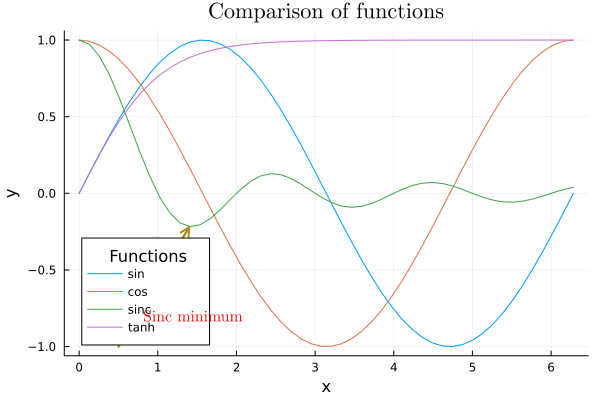

In [189]:
plt.plot(x,[sin, cos, sinc, tanh]; xguide="x",yguide="y",
    label=["sin" "cos" "sinc" "tanh"])
plt.plot!(legend=:best,legendtitle="Functions")
plt.plot!(title="Comparison of functions",
    titlefont=plt.font(14,"Computer Modern"))
plt.plot!(ann=(1.45,-0.8,
    plt.text("Sinc minimum","Computer Modern",10,:red,:center)))
plt.plot!([(0.5,-1),(1.4,-0.22)],lw=2,arrow=(1,0.5),label=false)

## Plots and axes
### Limiting the plot ranges
Keywords `xlim` and `ylim` (, and `zlim`) limitis the range of the respective axes by setting them equal to a pair (tuple) of minimum and maximum values.

### Twin axes
Applying function `twinx()` as the first argument in the modifying plot command (`plot!()`, but after a figure identifier) adds a second ordinate axis for that plot on the *right* hand side.

### Axes scaling
Keywords `xscale` and `yscale` (and `zscale`) allows for logarithmic scaling of the axes by setting the keywords equal to symbol `:log10`. Observe that this fails if the values are zero or negative.

### Reversing the axes directions
Keyword `flip` set to `Bool` (`true`, `false`) reverses the direction of all axes when set to `true`. Keywords `xflip` and `yflip` (, and `zflip`) set to a `Bool`reverses the directions of the individual axes when set to `true`.

### Plot frame
The plot may be framed by specifying keyword `framestyle` or `frame` for short, with valid values `:box`, `:semi`, `:axes` (default), `:origin`, `:zerolines`, `:grid`, and `:none`.

### Grids
Keyword `grid` can be used to specify the main grid, with values, e.g., `true` (default), `false`, `:x`, `:y`, `:z`, `:xy`, ...

The grid can be specified by keywords `gridcolor`, `gridalpha` (`ga`) (default: `0.1`), `gridlinewidth` (default: `0.5`), `gridstyle` (default: `:solid`).

Keyword `minorgrid` can be used to specify a minor grid, with the same options as for `grid` (default: `false`).  The minor grid can be further specified by keywords `minorgridcolor`, `minorgridalpha` (default: `0.1`), `minorgridlinewidth` (default: `0.05`), `minorgridstyle` (default: `:solid`).

### Axis and ticks
Keyword `minorticks` can be given a `Bool` value (default: `true`), or an integer number of minor tick lines between major tick lines.

Keyword `showaxis` admits the same values as for keywords `grid` and `minorgrid`; axes that are suppressed do not show tick marks.

Keywords `tick_direction` specifies the placement of tick marks (value: `:in` (default), `:out`). 

Abscissa tick positions can specified by keyword `xtick`, with value a *vector* of tick positions. It is also possible to change the actual tick *text* by providing keyword `xtick` with a pair (tuple) of *equal-length vectors* with first element being a vector of tick positions, and second element being a vector of tick text. Sometimes, it is useful to rotate the tick text: this can be done by keyword `xrot` set to a rotation in degrees. Similarly for `ytick`, with `yrot`.

Tick text *properties* can be specified just as for other texts, by replacing placeholder `§` with `tick`, i.e., `tickfontcolor`, etc.

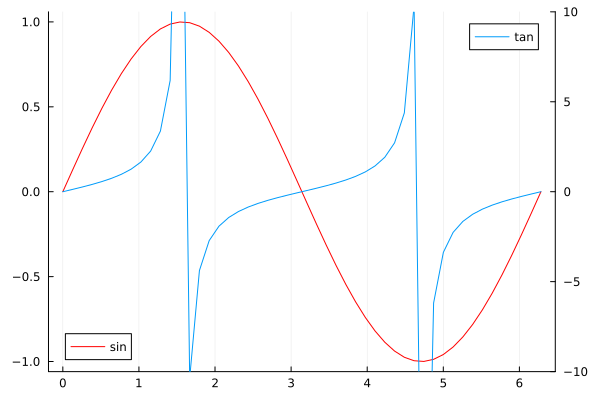

In [190]:
plt.plot(x,sin,lc=:red,label="sin",legend=:bottomleft)
plt.plot!(plt.twinx(),x,tan,ylim=(-10,10),label="tan")

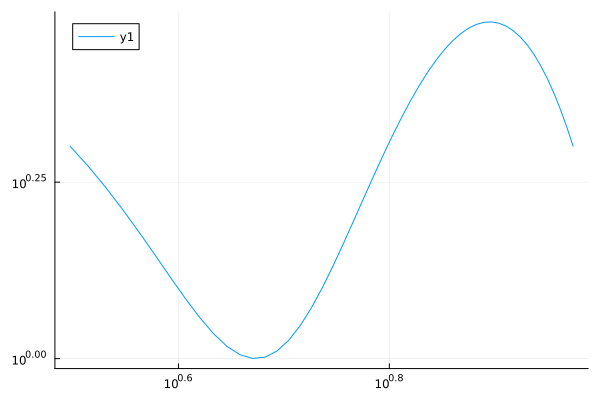

In [191]:
x = range(pi,3pi,length=50)
plt.plot(x,2 .+sin.(x),xscale=:log10,yscale=:log10)

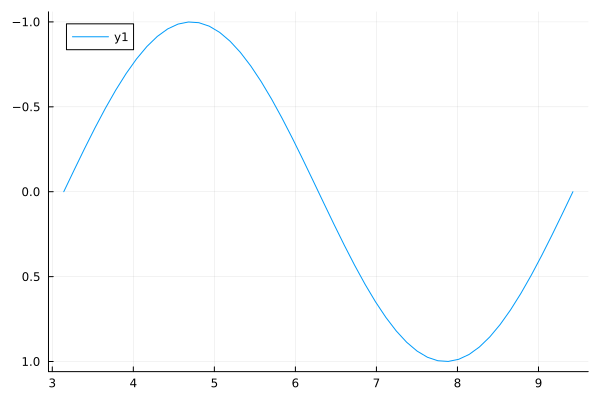

In [192]:
plt.plot(x,sin;yflip=true)

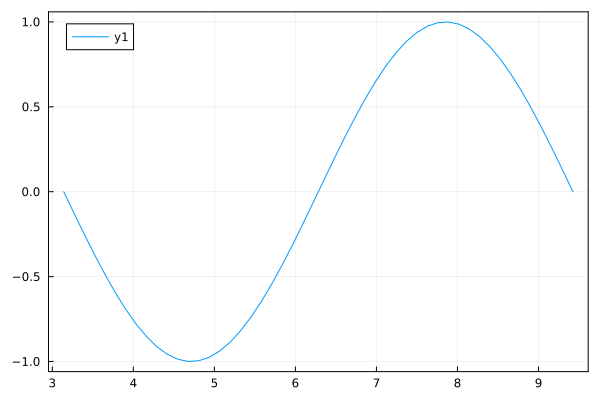

In [193]:
plt.plot(x,sin;framestyle=:box)

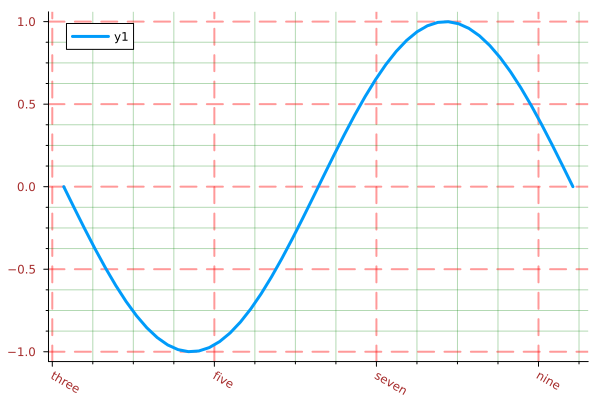

In [194]:
plt.plot(x,sin;lw=3,gridcolor=:red,gridalpha=0.4,gridlinewidth=2,gridstyle=:dash,
    minorgrid=true,minorgridcolor=:green,minorgridlinewidth=1,
    minorgridstyle=:solid, minorgridalpha=0.3,minorticks=4,showaxis=:xy,
    tick_direction=:out, tickfontcolor=plt.colorant"brown",
    xtick=([3,5,7,9], ["three","five","seven","nine"]),xrot=-30)

## Default plot settings
It is possible to set default values for `Plots.jl` keywords using function `default`. Keyword `fontfamily` specifies a font family that is inherited for all text, unless otherwise specified specifically. 
```julia
plot_font = "Computer Modern"
default(fontfamily=plot_font,
        linewidth=2, framestyle=:box, label=nothing, grid=false)
```
If package `Plots` has been imported with an alias such as `plt`, the function call becomes `plt.default(...)`.

It is recommended to specify default settings at the beginning of the notebook/code to ensure consistent results.

## 3D plots
### Surface plots
Surface plots are simple to plot for a *function*. What is needed is an ordered data vector for `x`, an ordered data vector for `y`, and a function `f(x,y)` where `x` and `y` are scalars, and where function `f(x,y)` returns a scalar value. Valid series types are `:surface`, `:wireframe`, `:mesh3d` (some backends), `:contour`, `:contourf` (filled contour), `:contour3d` (some bakends). The syntax is then, e.g., `plot(x,y,f; st=:surface)`. Keywords `:surface` and `:mesh3d` produces a heatmap bar to indicate the height.

In order to plot surface plots for *data*, we need a `z` *matrix* for all combinations of `x` and `y`. This `z` matrix can be created by *comprehension*, e.g.,
```julia
z = [f(xx,yy) for xx in x, yy i y]
plot(x,y,z; st=:surface)
```
or set up from experimental data.

The color gradient used in the plot, can be set using keyword `facecolor`, `fc`, with value taken from the symbols of color gradients, e.g., `:Spectral`, etc. 

A useful keyword is `camera`, which can be given a *tuple* value with first element being the *azimuth* angle and the second element being the *elevation* angle, e.g., `camera=(-30,30)`. [Keyword `camera` currently does not work with the `GR` backend.]

### Line plots
3D lineplots require a vector `x`, a vector `y`, and a vector `z`; all three vectors must be of the same length. Using keyword `:path3d` produces a line in 3D.

Most keywords for 2D line plots should work, including using color gradient for the line color.

A useful keyword is `camera`, which can be given a *tuple* value with first element being the *azimuth* angle and the second element being the *elevation* angle, e.g., `camera=(-30,30)`.

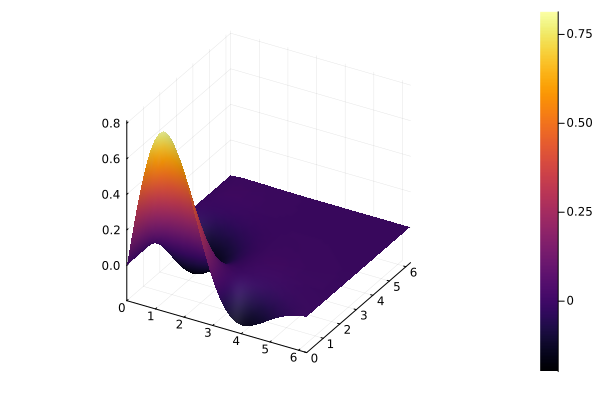

In [195]:
x = range(0,2pi,length=40)
y = range(0,2pi,length=40)
f(x,y) = sin(x)*cos(y)*exp(-x^2/10 - y^2/10 - x*y/5)
plt.plot(x,y,f;st=:surface)

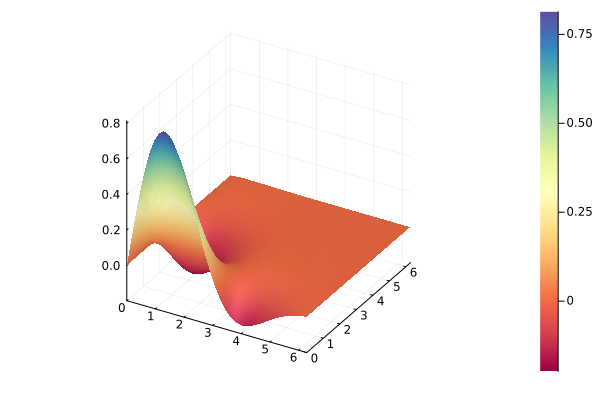

In [196]:
plt.plot(x,y,f;st=:surface,fc=:Spectral)

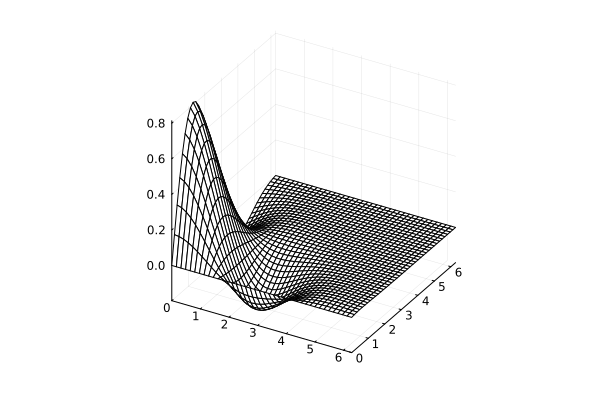

In [197]:
z = [f(xx,yy) for xx in x, yy in y]
plt.plot(x,y,z;st=:wireframe)

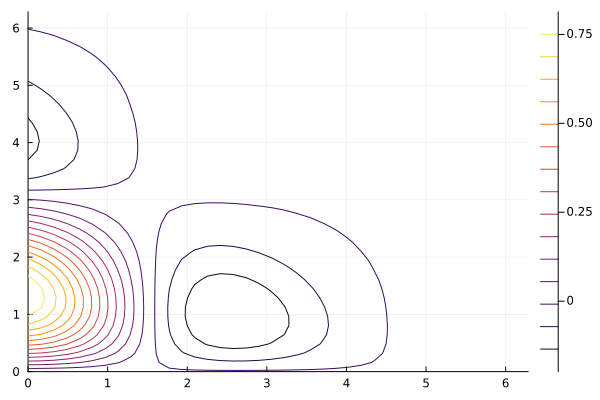

In [198]:
plt.plot(x,y,z;st=:contour)

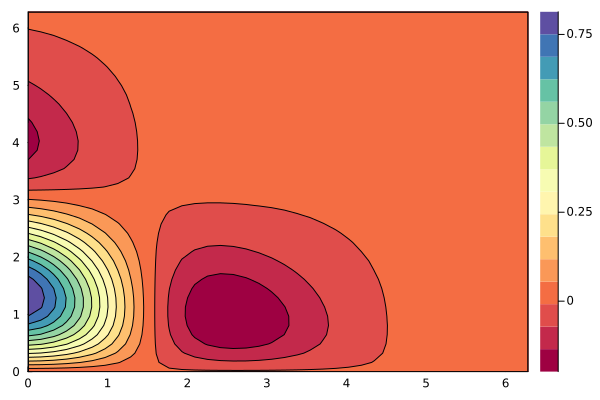

In [199]:
plt.plot(x,y,z;st=:contourf,fc=:Spectral)

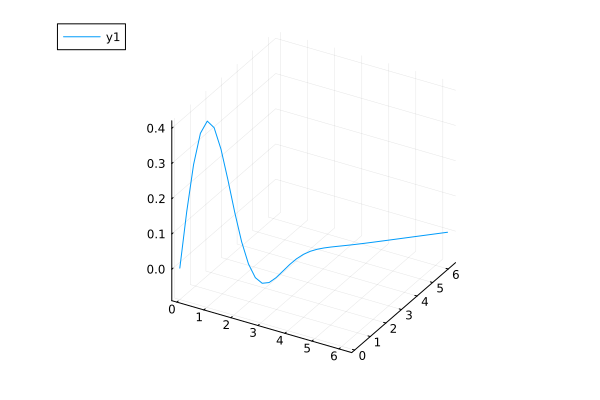

In [200]:
plt.plot(x,y,f.(x,y);st=:path3d)

## Histograms
Histograms are important in statistics. Plots with series type with value `:histogram` have alias `histogram()`, where no series type needs to be specified. Similarly, plots with series type `:histogram2d` have alias `histogram2d()`. The required argument for `histogram` is a vector `x` of values. For `histogram2d`, a pair of vectors `x` and `y` is required.

For histograms, keyword `bins` defines the approximate number of bins to aim for, and allows values `:auto` (default; the Freedman-Diaconis rule) as well as other auto-binning algorithms such as `:sturges`, `:sqrt`, `:rice`, `:scott` or `:fd` (Freedman-Diaconis), as well as integer value, or a vector of break values, e.g., `range(minimum(x), stop = maximum(x), length = 25)`.
 
Keyword `normalize` with possible values `false`, `:none` (default, no normalization), `true`, `:pdf` (gives a discrete probability density function with total area = 1), `:probability` (bin heights sum to 1), and `:density` (area of each bin, rather than the height, is equal to the count -- useful for uneven bin counts). 
 
Keyword `show_empty_bins` with `Bool` value specifies whether empty bins in a 2D histogram are colored as 0 (true), or transparent (the default).

Other keywords exist.

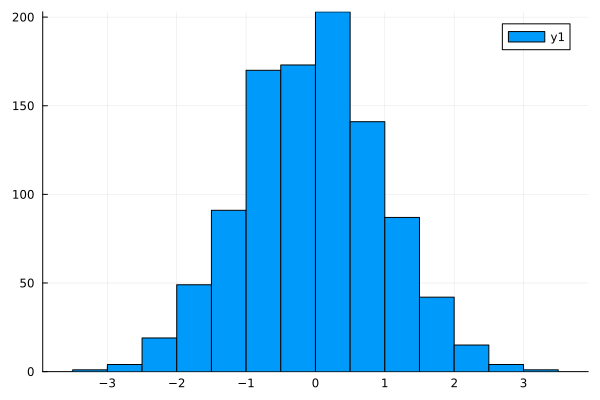

In [201]:
x = randn(1000)
plt.plot(x; st=:histogram)

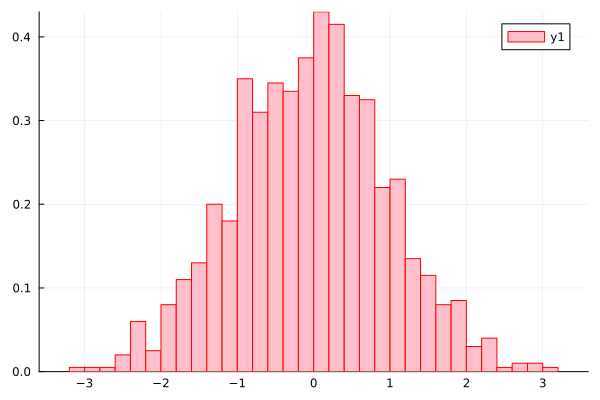

In [202]:
plt.plot(x; st=:histogram, bins=50, normalize=:pdf,fc=:pink,lc=:red)

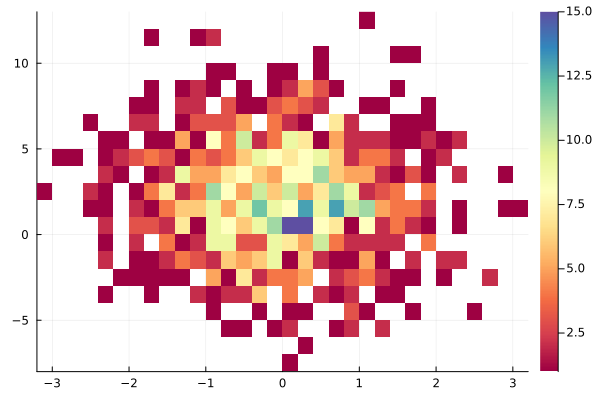

In [203]:
y = 3*randn(10^3) .+ 2
plt.plot(x,y; st=:histogram2d, bins=30, fc=:Spectral)

## Images
To operate on images, it is convenient to import package `Images.jl`. This packages allows for `load`:ing images of various types, e.g., `.jpg`, etc.

The result is a *matrix* of RGB data, and it is possible to do all sorts of transformations on the data, as well as `plot`:ting the data, and saving the resulting figure.

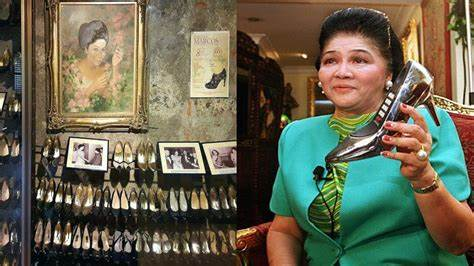

In [204]:
import Images as img
pic = img.load("../figs/Imelda_Shoe.jpg")

In [205]:
typeof(pic)

Matrix{RGB{N0f8}} (alias for Array{ColorTypes.RGB{FixedPointNumbers.Normed{UInt8, 8}}, 2})

In [206]:
size(pic)

(266, 474)

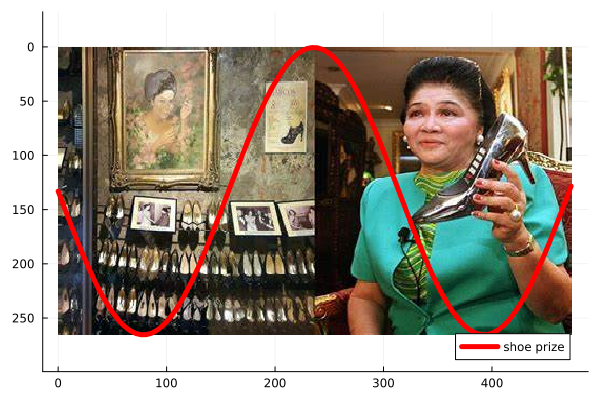

In [207]:
x = range(0,473,length=100)
y = sin.(x/50)*(266-1)/2 .+ 266/2
#
plt.plot(pic)
plt.plot!(x,y; lw=5,lc=:red,label="shoe prize")

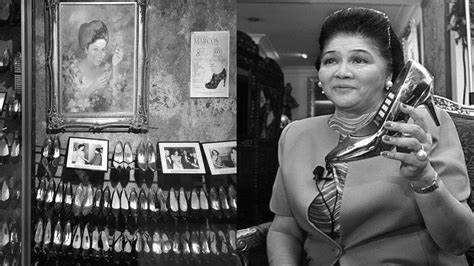

In [208]:
picg = plt.Gray.(pic)

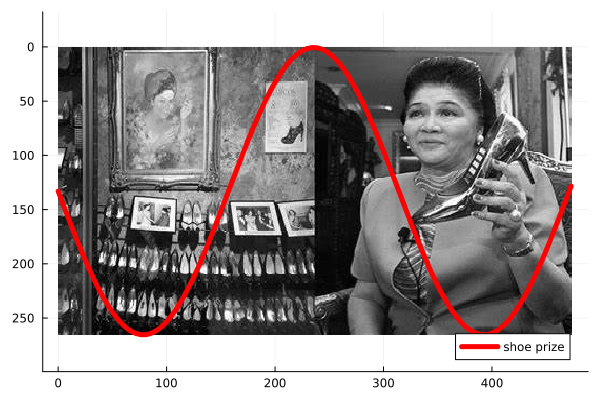

In [209]:
plt.plot(picg)
plt.plot!(x,y; lw=5,lc=:red,label="shoe prize")

## Animation - GIFs
Animations can be created by putting plot snapshots into an animation object. Such an animation object is instantiated via constructor `Animation()`. Then, snapshots are added to the animation object via function `frame()`, applied to the animation object. Typically:
```julia
anim = Animation()
for ...
    create a plot
    frame(anim)
end
```

When the animation (e.g., `anim`) has been created, it is necessary to produce a `GIF` file from the animation. This is done via function `gif(animation_object,file_name=tmp.gif)` where `file_name`has a default value `tmp.gif` and may be skipped. A keyword `fps` admits an integer number for the number of *frames per second* in the `.gif` file.

In [210]:
x = range(0,2pi,length=100)
y = sin.(x)
#
anim = plt.Animation()
for i in 1:length(x)
    plt.plot(x[1:i],y[1:i]; xlim=(0,2pi),ylim=(-1,1))
    plt.frame(anim)
end

In [211]:
typeof(anim)

Plots.Animation

┌ Info: Saved animation to c:\Users\Bernt_Lie\OneDrive\Documents\booksBLSOL\Julia\Notebooks\anim.gif
└ @ Plots C:\Users\Bernt_Lie\.julia\packages\Plots\3BCH5\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Bernt_Lie\\OneDrive\\Documents\\booksBLSOL\\Julia\\Notebooks\\anim.gif")
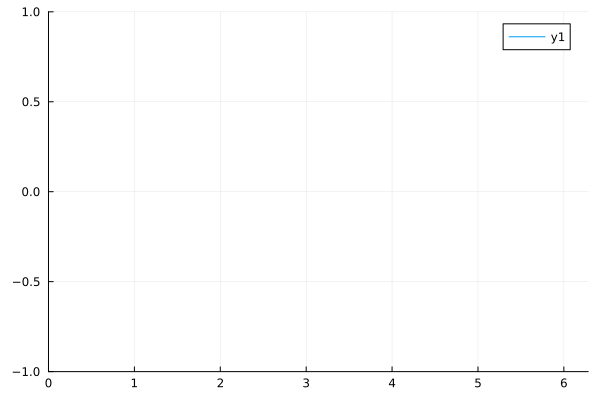

In [212]:
plt.gif(anim,"anim.gif")